In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv("data.csv")      
df.head()

,DateTime,Consumer 1 - steam consumption in kg/h,burner performance in %,water feeding pump performance in %,water level in feeding water tank in %,temperature feeding water tank,water level in condensate collection tank,consumer 2 - steam inflow valve - degree of opening in %,consumer 3 - steam consumption in kg/h,gas count in kg total,gas consumption in kg,consumer 3 - total steam consumption in kg,consumer 3 - steam consumption in kg/minute,consumer 4 - total steam consumption in kg,consumer 4 - steam consumption in kg / minute,Pressure steam boiler in bar
0,01/02/23 00:00,-1.193576,2.370000e-41,40.0,36.964699,98.625580,59.313511,0.025318,0.0,176,NaN,865,NaN,198,NaN,9.296875
1,01/02/23 00:01,-0.542535,2.370000e-41,40.0,36.964699,98.791954,59.313511,0.021701,0.0,176,0.0,865,0.0,198,0.0,9.287000
2,01/02/23 00:02,-0.542535,2.370000e-41,40.0,36.971931,99.168114,59.317131,0.025318,0.0,176,0.0,865,0.0,198,0.0,9.274900
3,01/02/23 00:03,-0.651042,2.370000e-41,40.0,36.975552,98.987267,59.313511,0.021701,0.0,176,0.0,865,0.0,198,0.0,9.274900
4,01/02/23 00:04,-0.434028,2.370000e-41,40.0,36.971931,98.842590,59.313511,0.025318,0.0,176,0.0,865,0.0,198,0.0,9.264500


In [3]:
df.shape

(1440, 16)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1440 entries, 0 to 1439
Data columns (total 16 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   DateTime                                                  1440 non-null   object 
 1   Consumer 1 - steam consumption in kg/h                    1440 non-null   float64
 2   burner performance in %                                   1440 non-null   float64
 3   water feeding pump performance in %                       1440 non-null   float64
 4   water level in feeding water tank in %                    1440 non-null   float64
 5   temperature feeding water tank                            1440 non-null   float64
 6   water level in condensate collection tank                 1440 non-null   float64
 7   consumer 2 - steam inflow valve - degree of opening in %  1440 non-null   float64
 8   consumer 3 - steam

In [5]:
df.isnull().sum()

DateTime                                                    0
Consumer 1 - steam consumption in kg/h                      0
burner performance in %                                     0
water feeding pump performance in %                         0
water level in feeding water tank in %                      0
temperature feeding water tank                              0
water level in condensate collection tank                   0
consumer 2 - steam inflow valve - degree of opening in %    0
consumer 3 - steam consumption in kg/h                      0
gas count in kg total                                       0
gas consumption in kg                                       1
consumer 3 - total steam consumption in kg                  0
consumer 3 - steam consumption in kg/minute                 1
consumer 4 - total steam consumption in kg                  0
consumer 4 - steam consumption in kg / minute               1
Pressure steam boiler in bar                                0
dtype: i

In [6]:
df.dropna(inplace=True)

In [7]:
df.isnull().sum()

DateTime                                                    0
Consumer 1 - steam consumption in kg/h                      0
burner performance in %                                     0
water feeding pump performance in %                         0
water level in feeding water tank in %                      0
temperature feeding water tank                              0
water level in condensate collection tank                   0
consumer 2 - steam inflow valve - degree of opening in %    0
consumer 3 - steam consumption in kg/h                      0
gas count in kg total                                       0
gas consumption in kg                                       0
consumer 3 - total steam consumption in kg                  0
consumer 3 - steam consumption in kg/minute                 0
consumer 4 - total steam consumption in kg                  0
consumer 4 - steam consumption in kg / minute               0
Pressure steam boiler in bar                                0
dtype: i

<AxesSubplot:>

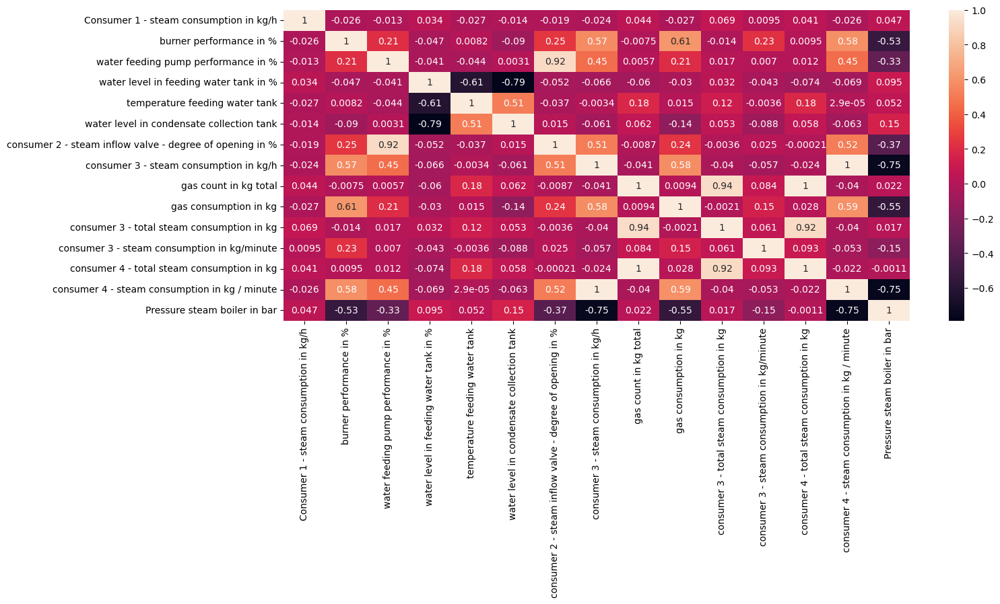

In [8]:
plt.figure(figsize=(15,6))
sns.heatmap(df.corr(),annot=True)

In [9]:
corr_matrix = df.corr()

In [10]:
# Get the column names of the DataFrame
columns = corr_matrix.columns

# Create an empty list to keep track of columns to drop
columns_to_drop = []

# Loop over the columns
for i in range(len(columns)):
    for j in range(i + 1, len(columns)):
        # Access the cell of the DataFrame
        if corr_matrix.loc[columns[i], columns[j]] > 0.95:
            columns_to_drop.append(columns[j])

print(columns_to_drop)

['consumer 4 - steam consumption in kg / minute', 'consumer 4 - total steam consumption in kg']


In [11]:
df.drop(columns=['consumer 4 - steam consumption in kg / minute'],axis=1,inplace=True)

In [12]:
df.head()

,DateTime,Consumer 1 - steam consumption in kg/h,burner performance in %,water feeding pump performance in %,water level in feeding water tank in %,temperature feeding water tank,water level in condensate collection tank,consumer 2 - steam inflow valve - degree of opening in %,consumer 3 - steam consumption in kg/h,gas count in kg total,gas consumption in kg,consumer 3 - total steam consumption in kg,consumer 3 - steam consumption in kg/minute,consumer 4 - total steam consumption in kg,Pressure steam boiler in bar
1,01/02/23 00:01,-0.542535,2.370000e-41,40.0,36.964699,98.791954,59.313511,0.021701,0.0,176,0.0,865,0.0,198,9.2870
2,01/02/23 00:02,-0.542535,2.370000e-41,40.0,36.971931,99.168114,59.317131,0.025318,0.0,176,0.0,865,0.0,198,9.2749
3,01/02/23 00:03,-0.651042,2.370000e-41,40.0,36.975552,98.987267,59.313511,0.021701,0.0,176,0.0,865,0.0,198,9.2749
4,01/02/23 00:04,-0.434028,2.370000e-41,40.0,36.971931,98.842590,59.313511,0.025318,0.0,176,0.0,865,0.0,198,9.2645
5,01/02/23 00:05,-0.542535,2.370000e-41,40.0,36.971931,98.654518,59.317131,0.021701,0.0,176,0.0,865,0.0,198,9.2535


<AxesSubplot:>

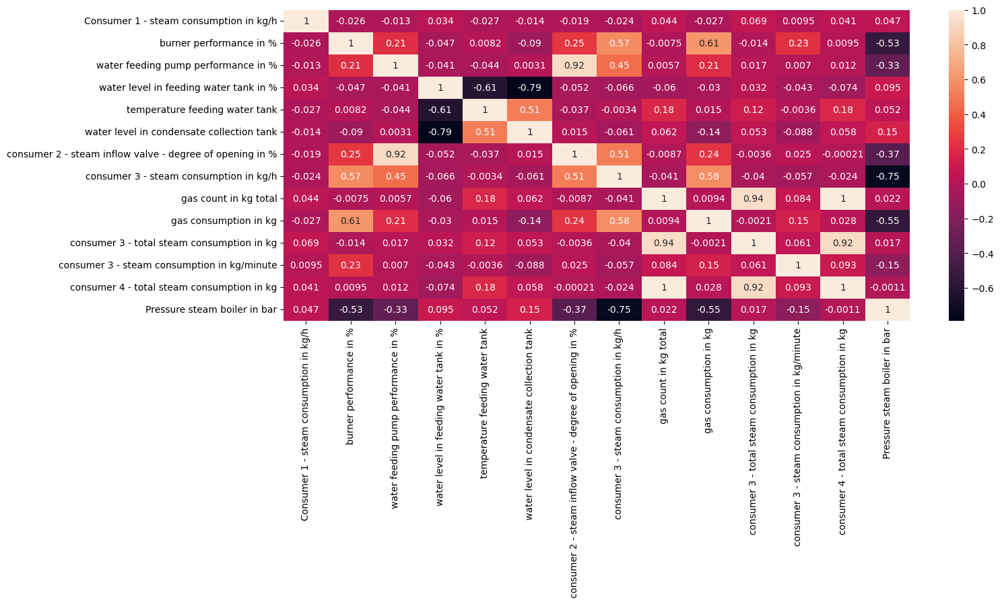

In [13]:
plt.figure(figsize=(15,6))
sns.heatmap(df.corr(),annot=True)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1439 entries, 1 to 1439
Data columns (total 15 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   DateTime                                                  1439 non-null   object 
 1   Consumer 1 - steam consumption in kg/h                    1439 non-null   float64
 2   burner performance in %                                   1439 non-null   float64
 3   water feeding pump performance in %                       1439 non-null   float64
 4   water level in feeding water tank in %                    1439 non-null   float64
 5   temperature feeding water tank                            1439 non-null   float64
 6   water level in condensate collection tank                 1439 non-null   float64
 7   consumer 2 - steam inflow valve - degree of opening in %  1439 non-null   float64
 8   consumer 3 - steam

In [15]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
features = [ 'Consumer 1 - steam consumption in kg/h',
       'burner performance in %', 'water feeding pump performance in %',
       'water level in feeding water tank in %',
       'temperature feeding water tank',
       'water level in condensate collection tank',
       'consumer 2 - steam inflow valve - degree of opening in %',
       'consumer 3 - steam consumption in kg/h', 'gas count in kg total',
       'gas consumption in kg', 'consumer 3 - total steam consumption in kg',
       'consumer 3 - steam consumption in kg/minute']
target = 'Pressure steam boiler in bar'

In [17]:
X = df.copy()
y = df[['Pressure steam boiler in bar']]

In [18]:
X.head()

,DateTime,Consumer 1 - steam consumption in kg/h,burner performance in %,water feeding pump performance in %,water level in feeding water tank in %,temperature feeding water tank,water level in condensate collection tank,consumer 2 - steam inflow valve - degree of opening in %,consumer 3 - steam consumption in kg/h,gas count in kg total,gas consumption in kg,consumer 3 - total steam consumption in kg,consumer 3 - steam consumption in kg/minute,consumer 4 - total steam consumption in kg,Pressure steam boiler in bar
1,01/02/23 00:01,-0.542535,2.370000e-41,40.0,36.964699,98.791954,59.313511,0.021701,0.0,176,0.0,865,0.0,198,9.2870
2,01/02/23 00:02,-0.542535,2.370000e-41,40.0,36.971931,99.168114,59.317131,0.025318,0.0,176,0.0,865,0.0,198,9.2749
3,01/02/23 00:03,-0.651042,2.370000e-41,40.0,36.975552,98.987267,59.313511,0.021701,0.0,176,0.0,865,0.0,198,9.2749
4,01/02/23 00:04,-0.434028,2.370000e-41,40.0,36.971931,98.842590,59.313511,0.025318,0.0,176,0.0,865,0.0,198,9.2645
5,01/02/23 00:05,-0.542535,2.370000e-41,40.0,36.971931,98.654518,59.317131,0.021701,0.0,176,0.0,865,0.0,198,9.2535


In [19]:
y.head()

,Pressure steam boiler in bar
1,9.2870
2,9.2749
3,9.2749
4,9.2645
5,9.2535


In [20]:
# Modelling
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

from sklearn.linear_model import LinearRegression, Ridge,Lasso
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error,accuracy_score 

from sklearn.preprocessing import StandardScaler

In [21]:
scaler = StandardScaler()
X[features] = scaler.fit_transform(X[features])

In [22]:
X.head()

,DateTime,Consumer 1 - steam consumption in kg/h,burner performance in %,water feeding pump performance in %,water level in feeding water tank in %,temperature feeding water tank,water level in condensate collection tank,consumer 2 - steam inflow valve - degree of opening in %,consumer 3 - steam consumption in kg/h,gas count in kg total,gas consumption in kg,consumer 3 - total steam consumption in kg,consumer 3 - steam consumption in kg/minute,consumer 4 - total steam consumption in kg,Pressure steam boiler in bar
1,01/02/23 00:01,0.576715,-0.693865,-0.474357,-1.249798,0.938218,1.552135,-0.439011,-0.660913,-1.621837,-0.711411,-0.93279,-0.239919,198,9.2870
2,01/02/23 00:02,0.576715,-0.693865,-0.474357,-1.244047,1.880704,1.553401,-0.438815,-0.660913,-1.621837,-0.711411,-0.93279,-0.239919,198,9.2749
3,01/02/23 00:03,0.318020,-0.693865,-0.474357,-1.241169,1.427583,1.552135,-0.439011,-0.660913,-1.621837,-0.711411,-0.93279,-0.239919,198,9.2749
4,01/02/23 00:04,0.835410,-0.693865,-0.474357,-1.244047,1.065090,1.552135,-0.438815,-0.660913,-1.621837,-0.711411,-0.93279,-0.239919,198,9.2645
5,01/02/23 00:05,0.576715,-0.693865,-0.474357,-1.244047,0.593866,1.553401,-0.439011,-0.660913,-1.621837,-0.711411,-0.93279,-0.239919,198,9.2535


In [23]:
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.30,random_state=42)

In [24]:
def evaluate_model(true, predicted):
    mae = mean_absolute_error(true, predicted)
    mse = mean_squared_error(true, predicted)
    rmse = np.sqrt(mean_squared_error(true, predicted))
    r2_square = r2_score(true, predicted)
    return mae, rmse, r2_square

In [25]:
models = {
    "Linear Regression": LinearRegression(),
    "Ridge": Ridge(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest Regressor": RandomForestRegressor(random_state=42)
}
model_list = []
r2_list =[]

for i in range(len(list(models))):
    model = list(models.values())[i]
    model.fit(x_train[features], y_train) # Train model

    # Make predictions
    y_test_pred = model.predict(x_test[features])
    
    # Evaluate Train and Test dataset
    model_test_mae , model_test_rmse, model_test_r2 = evaluate_model(y_test, y_test_pred)

    
    print(list(models.keys())[i])
    model_list.append(list(models.keys())[i])
    
    print('Model performance for Test set')
    print("- Root Mean Squared Error: {:.4f}".format(model_test_rmse))
    print("- Mean Absolute Error: {:.4f}".format(model_test_mae))
    print("- R2 Score: {:.4f}".format(model_test_r2))
    r2_list.append(model_test_r2)
    
    print('='*35)
    print('\n')

Linear Regression
Model performance for Test set
- Root Mean Squared Error: 0.2997
- Mean Absolute Error: 0.2303
- R2 Score: 0.6347


Ridge
Model performance for Test set
- Root Mean Squared Error: 0.2996
- Mean Absolute Error: 0.2303
- R2 Score: 0.6349


Decision Tree
Model performance for Test set
- Root Mean Squared Error: 0.2106
- Mean Absolute Error: 0.1250
- R2 Score: 0.8196


Random Forest Regressor
Model performance for Test set
- Root Mean Squared Error: 0.1567
- Mean Absolute Error: 0.1056
- R2 Score: 0.9002




In [26]:
rf = RandomForestRegressor(random_state=42)
rf.fit(x_train[features],y_train)

RandomForestRegressor(random_state=42)

In [27]:
test_data_pred = rf.predict(x_test[features])
rf_r2_score = r2_score(y_test,test_data_pred)
print(rf_r2_score*100)

90.017251846225


In [28]:
x_test['Predicted'] = test_data_pred

In [29]:
x_test['DateTime'] = pd.to_datetime(x_test['DateTime'])
x_test = x_test.set_index('DateTime')

<AxesSubplot:xlabel='DateTime'>

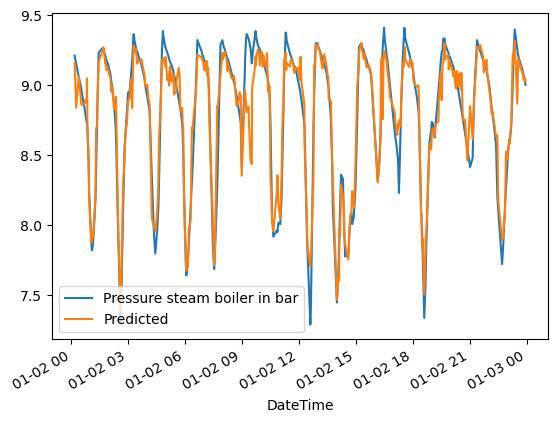

In [34]:
x_test[target].plot(legend=target)
x_test['Predicted'].plot(legend='Predicted')